# MP0 : Image Demosaicing

Welcome to CS 543! This assignment is a warm-up assignment to get you back up working from the winter break! We will try to provide you an iPython Notebook (like this) for all the future assignments! The notebook will provide you some further instructions(implementation related mainly), in addition to the ones provided on class webpage.

### Import statements

The following cell is only for import statements. You can use any of the 3 : cv2, matplotlib or skimage for image i/o and other functions. We will provide you the names of the relevant functions for each module. __{For convenience provided at the end of the class assignment webpage}__

In [99]:
import numpy as np
import cv2
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import skimage
import scipy
from skimage import img_as_float
%matplotlib inline

### Reading the Mosaic Image

In [132]:
def read_image(IMG_NAME):
    img = cv2.imread(IMG_NAME)[...,::-1] #To convert BGR format of cv2 to RGB format for coloured images 
    return img

In [133]:
IMG_DIR = 'images/'
IMG_NAME = 'crayons.bmp'
mosaic_img = read_image(IMG_DIR+IMG_NAME)# YOUR CODE HERE
color_img = read_image(IMG_DIR+'crayons.jpg')

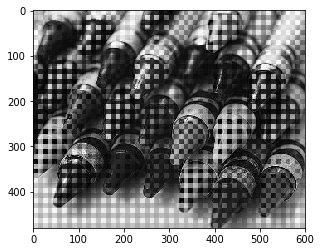

In [134]:
# For a sanity check, display your image here
plt.imshow(mosaic_img)
plt.show()

### Linear Interpolation

In [135]:
#Returns the masks for the red, green and blue components of the image 
def create_mask(mosaic_img):
    float_mosaic_img = np.float32(mosaic_img)
    
    #Creating the masks for red, green and blue components to extract Bayer's individual components pattern from the image 
    red_mask = np.tile([[1, 0], [0, 0]], (int(mosaic_img.shape[0]/2), int(mosaic_img.shape[1]/2)))
    green_mask = np.tile([[0, 1], [1, 0]], (int(mosaic_img.shape[0]/2), int(mosaic_img.shape[1]/2)))
    blue_mask = np.tile([[0, 0], [0, 1]], (int(mosaic_img.shape[0]/2), int(mosaic_img.shape[1]/2)))

    #Extracting individual components from Bayer's pattern image and assigning zeros for other components 
    red_image = float_mosaic_img[:,:,0]*red_mask
    green_image = float_mosaic_img[:,:,1]*green_mask
    blue_image = float_mosaic_img[:,:,2]*blue_mask
    
    return red_image, green_image, blue_image

In [136]:
def linear_interp(mosaic_img):

    #Converting the type of image to float for computing averages correctly
    float_mosaic_img = np.float32(mosaic_img)
    
    ### HINT : For writing your kernels you might want to see the RGB Pattern provided on the website
    red_image, green_image, blue_image = create_mask(mosaic_img)
    
    ### HINT : To use filters you might want to write your kernels

    #Defining the Kernel matrix and performing convolution for individual components 
    red_weights =  np.array([[1/4.,1/2., 1/4.], [1/2., 1, 1/2.], [1/4., 1/2., 1/4.]])
    red_image_interpolated = scipy.ndimage.convolve(red_image, red_weights, mode='mirror') 
    #Using mirror mode for better results 

    blue_weights =  np.array([[1/4.,1/2., 1/4.], [1/2., 1, 1/2.], [1/4., 1/2., 1/4.]])
    blue_image_interpolated = scipy.ndimage.convolve(blue_image, blue_weights, mode='mirror') 
    #Using mirror mode for better results 

    green_weights =  np.array([[0.,1/4., 0.], [1/4., 1, 1/4.], [0., 1/4., 0.]])
    green_image_interpolated = scipy.ndimage.convolve(green_image, green_weights, mode='mirror')
    #Using mirror mode for better results 
    
    #Merging the three components of an image 
    new_img = cv2.merge((red_image_interpolated,green_image_interpolated,blue_image_interpolated))
    
    #Converting the data type back to uint8
    new_image = new_img.astype(np.uint8)
    
    return new_image

In [137]:
#Testing the linear interpolation 
linear_interp_image = linear_interp(mosaic_img)

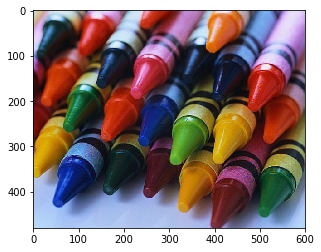

In [138]:
#Showing the image constructed using linear interpolation 
plt.imshow(linear_interp_image)
plt.show()

In [43]:
### HINT : To improve your kernels, you might want to use the squared difference 
###        between your solution image and the original image

In [139]:
def get_solution_image(mosaic_img):
    '''
    This function should return the soln image.
    Feel free to write helper functions in the above cells
    as well as change the parameters of this function.
    '''
    mosaic_shape = np.shape(mosaic_img)
    soln_image = np.zeros((mosaic_shape[0], mosaic_shape[1], 3))
    soln_image = linear_interp(mosaic_img) #Computing the coloured image using linear interpolation 
    return soln_image

In [322]:
def compute_errors(soln_image, original_image):
    '''
    Compute the Average and Maximum per-pixel error
    for the image.
    
    Also generate the map of pixel differences
    to visualize where the mistakes are made
    '''
    #Calculating the sum of squared differences 
    squrared_diff = ((img_as_float(soln_image)-img_as_float(original_image))**2) #Squared differences 
    squrared_diff_sum = squrared_diff[:, :, 0] + squrared_diff[:, :, 1] + squrared_diff[:, :, 2] 
    #Summing squared differences for each component 
    
    #Showing the plot of the squared differences pixel wise summed for all 3 components (R, G, B)
    plt.imshow (np.sqrt(squrared_diff_sum))#, cmap='binary')
    plt.title('Map of the sqaure root of sum of squares error')
    plt.colorbar()
    plt.show()
    
    pp_err = squrared_diff_sum.mean() #Calculating the average error 
    max_err = squrared_diff_sum.max() #Calculating the maximum error 
    
    return pp_err, max_err

We provide you with 3 images to test if your solution works. Once it works, you should generate the solution for test image provided to you.

### Training Image 1

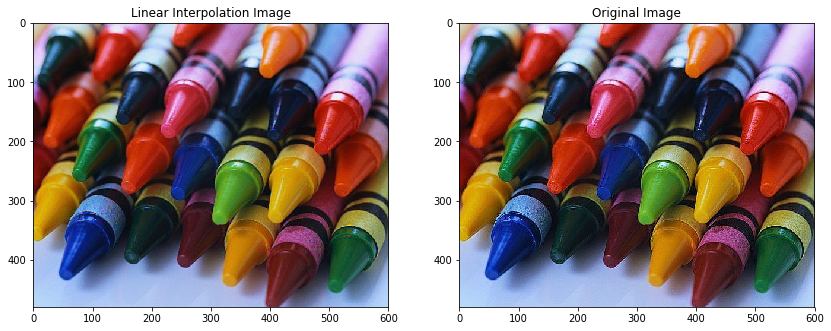

In [179]:
mosaic_img = read_image(IMG_DIR+'crayons.bmp')
soln_image = get_solution_image(mosaic_img)

'''
plt.figure()
plt.imshow(soln_image)
plt.savefig('crayons_linear_interp.jpg', dpi = 250)
'''
original_image = read_image(IMG_DIR+'crayons.jpg')

# For sanity check display your solution image here
plt.figure(figsize =(14, 7))
plt.subplot(1, 2, 1)
plt.imshow(soln_image)
plt.title('Linear Interpolation Image')

plt.subplot(1, 2, 2)
plt.imshow(original_image)
plt.title('Original Image')
#plt.colorbar()
plt.show()

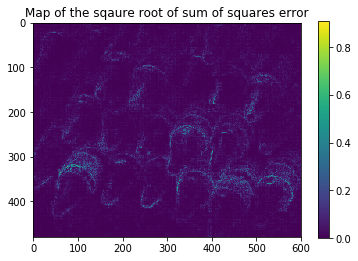

The average per-pixel error for crayons is: 0.0022069742406766626
The maximum per-pixel error for crayons is: 0.8248058439061898


In [180]:
pp_err, max_err = compute_errors(soln_image, original_image)
print("The average per-pixel error for crayons is: "+str(pp_err))
print("The maximum per-pixel error for crayons is: "+str(max_err))

### Zoom to see the artifacts

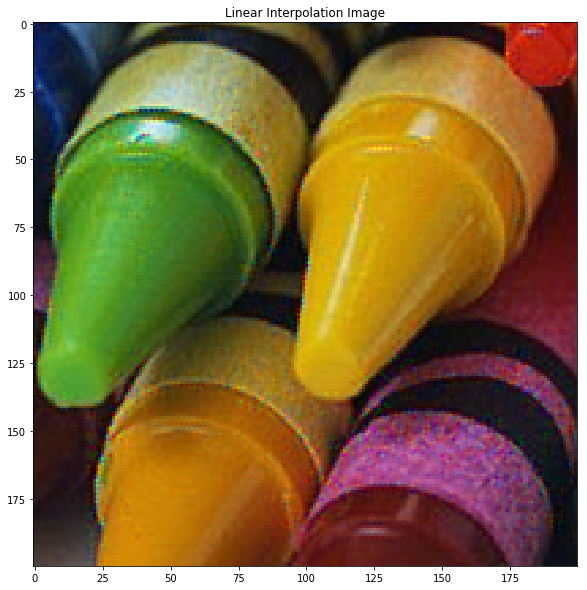

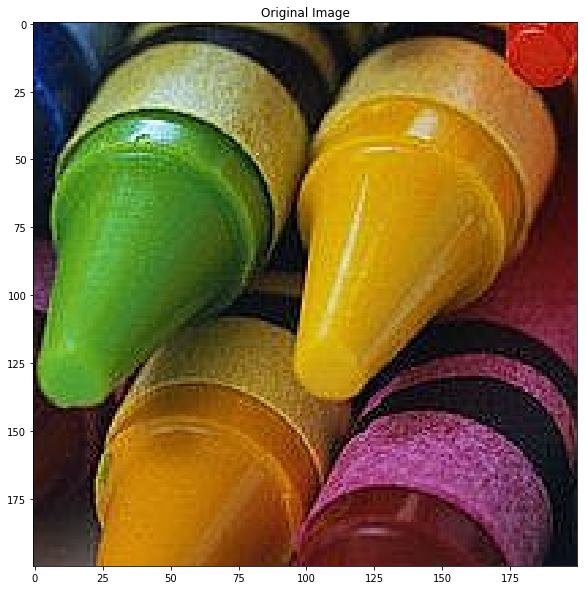

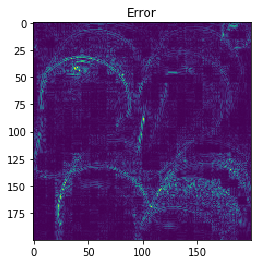

In [181]:
#Zoomin in to see where the artifacts occur
plt.figure(figsize = (17, 10))
#plt.subplot(1, 2, 1)
plt.imshow (soln_image[200:400, 300:500])
plt.title('Linear Interpolation Image')
plt.savefig('zoomin_linearinterp_crayons.jpg', dpi = 650)
plt.show()

plt.figure(figsize = (17, 10))
#plt.subplot(1, 2, 2)
plt.imshow (original_image[200:400, 300:500])
plt.title('Original Image')
plt.show()

#Calculating the sum of squared differences 
squrared_diff = ((np.float32(soln_image)-np.float32(original_image))**2) #Squared differences 
squrared_diff_sum = squrared_diff[:, :, 0] + squrared_diff[:, :, 1] + squrared_diff[:, :, 2] 

plt.imshow(np.sqrt(squrared_diff_sum[200:400, 300:500]))#, cmap ='binary')
plt.title('Error')
plt.savefig('zoomin_crayons.jpg')
plt.show()

### Training Image 2

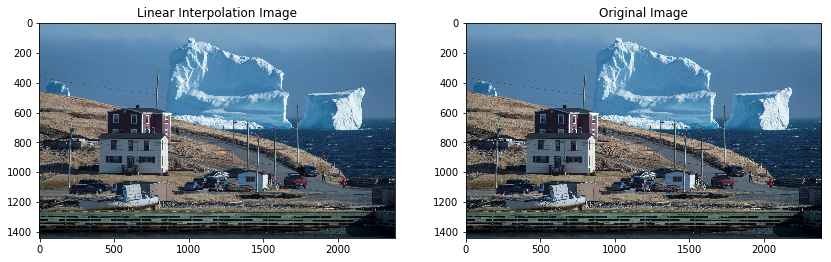

In [183]:
mosaic_img = read_image(IMG_DIR+'iceberg.bmp')
soln_image = get_solution_image(mosaic_img)

'''
plt.figure()
plt.imshow(soln_image)
plt.savefig('iceberg_linear_interp.jpg', dpi = 650)
'''

original_image = read_image(IMG_DIR+'iceberg.jpg')
# For sanity check display your solution image here

plt.figure(figsize =(14, 7))
plt.subplot(1, 2, 1)
plt.imshow(soln_image)
plt.title('Linear Interpolation Image')

plt.subplot(1, 2, 2)
plt.imshow(original_image)
plt.title('Original Image')
plt.show()

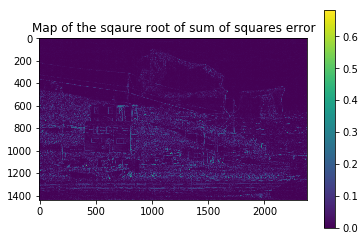

The average per-pixel error for iceberg is: 0.001618557492527202
The maximum per-pixel error for iceberg is: 0.46422145328719727


In [184]:
pp_err, max_err = compute_errors(soln_image, original_image)
print("The average per-pixel error for iceberg is: "+str(pp_err))
print("The maximum per-pixel error for iceberg is: "+str(max_err))

### Zoom to see the artifacts

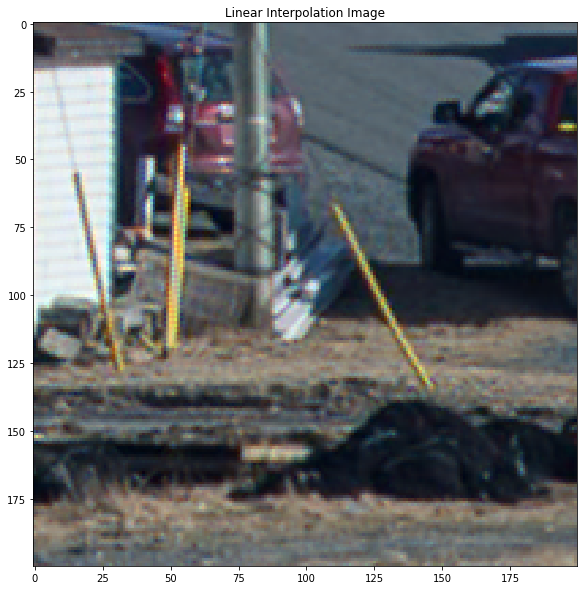

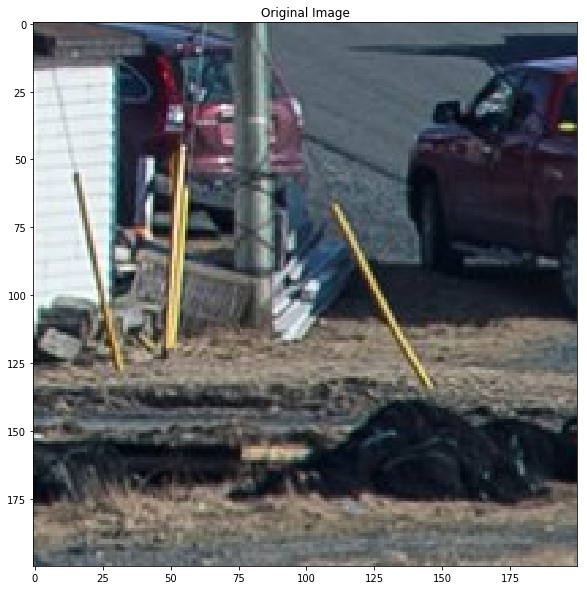

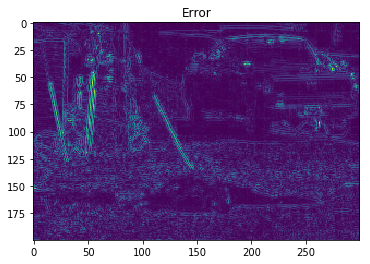

In [196]:
#Zoomin in to see where the artifacts occur
plt.figure(figsize = (17, 10))
#plt.subplot(1, 3, 1)
plt.imshow (soln_image[1000:1200, 1500:1700])
plt.title('Linear Interpolation Image')
plt.show()

plt.figure(figsize = (14, 10))
#plt.subplot(1, 3, 2)
plt.imshow (original_image[1000:1200, 1500:1700])
plt.title('Original Image')
plt.show()

#Calculating the sum of squared differences 
squrared_diff = ((np.float32(soln_image)-np.float32(original_image))**2) #Squared differences 
squrared_diff_sum = squrared_diff[:, :, 0] + squrared_diff[:, :, 1] + squrared_diff[:, :, 2] 

#plt.subplot(1, 3, 3)
plt.imshow(np.sqrt(squrared_diff_sum[1000:1200, 1500:1800]))#, cmap ='binary')
plt.title('Error')
plt.savefig('zoomin_iceberg.jpg', dpi = 550)
plt.show()

### Training Image 3

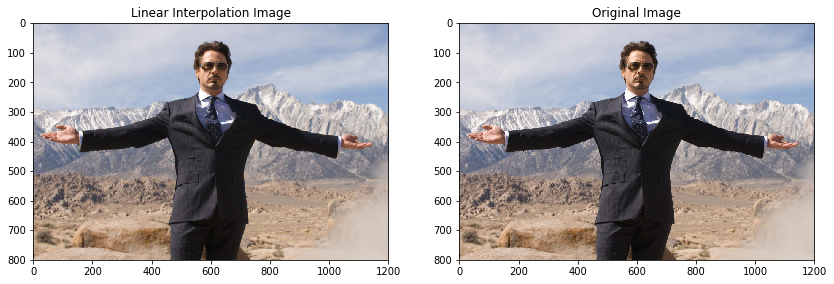

In [233]:
mosaic_img = read_image(IMG_DIR+'tony.bmp')
soln_image = get_solution_image(mosaic_img)

'''
plt.figure()
plt.imshow(soln_image)
plt.savefig('tony_linear_interp.jpg', dpi = 650)
'''

original_image = read_image(IMG_DIR+'tony.jpg')
# For sanity check display your solution image here

plt.figure(figsize =(14, 7))
plt.subplot(1, 2, 1)
plt.imshow(soln_image)
plt.title('Linear Interpolation Image')

plt.subplot(1, 2, 2)
plt.imshow(original_image)
plt.title('Original Image')
#plt.colorbar()
plt.show()

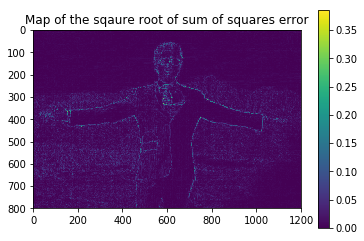

The average per-pixel error for tony is: 0.0003646001537870051
The maximum per-pixel error for tony is: 0.1482506728181469


In [199]:
pp_err, max_err = compute_errors(soln_image, original_image)
print("The average per-pixel error for tony is: "+str(pp_err))
print("The maximum per-pixel error for tony is: "+str(max_err))

### Zoom to see the artifacts

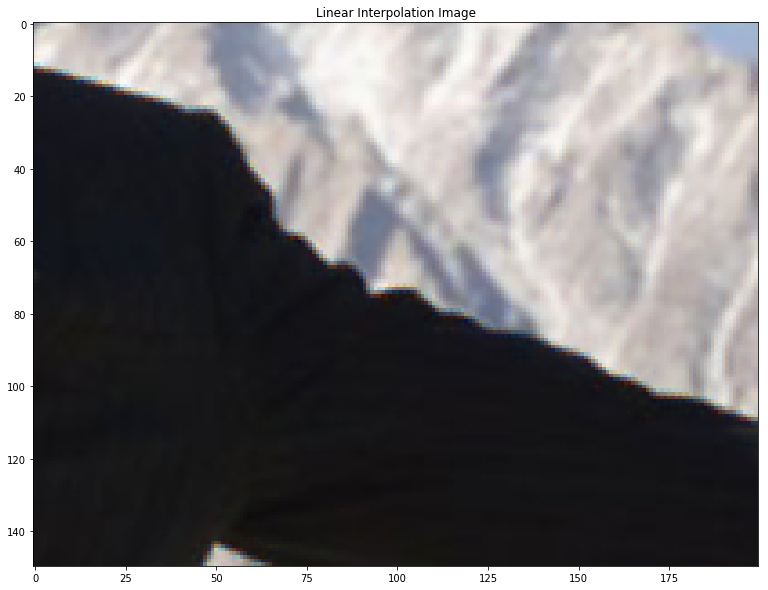

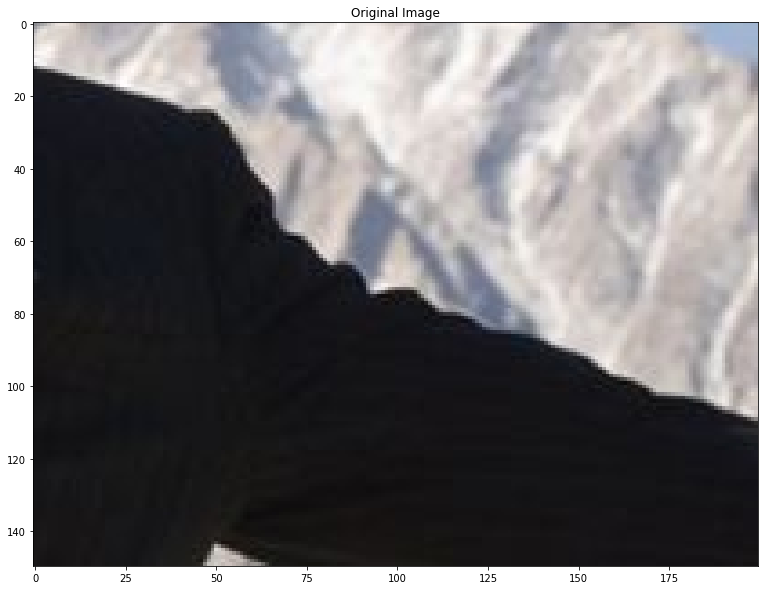

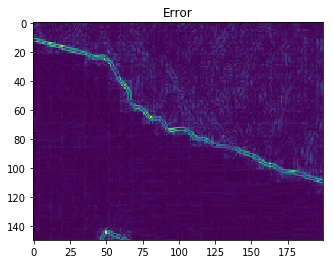

In [225]:
#Zoomin in to see where the artifacts occur
plt.figure(figsize = (24, 10))
#plt.subplot(1, 3, 1)
plt.imshow (soln_image[250:400, 700:900])
plt.title('Linear Interpolation Image')
plt.show()

plt.figure(figsize = (24, 10))
#plt.subplot(1, 3, 2)
plt.imshow (original_image[250:400, 700:900])
plt.title('Original Image')
plt.show()

#Calculating the sum of squared differences 
squrared_diff = ((np.float32(soln_image)-np.float32(original_image))**2) #Squared differences 
squrared_diff_sum = squrared_diff[:, :, 0] + squrared_diff[:, :, 1] + squrared_diff[:, :, 2] 

#plt.subplot(1, 3, 3)
plt.imshow(np.sqrt(squrared_diff_sum[250:400, 700:900]))
plt.title('Error')
plt.savefig('zoomin_tony.jpg')
plt.show()

### Testing Image

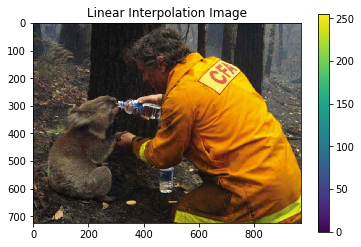

In [55]:
mosaic_img = read_image(IMG_DIR+'hope.bmp')
soln_image = get_solution_image(mosaic_img)

plt.imshow(soln_image)
plt.title('Linear Interpolation Image')
plt.colorbar()
plt.show()


### Freeman's Method

For details of the freeman's method refer to the class assignment webpage.

__MAKE SURE YOU FINISH LINEAR INTERPOLATION BEFORE STARTING THIS PART!!!__

In [330]:
def get_freeman_solution_image(mosaic_img):
    '''
    This function should return the freeman soln image.
    Feel free to write helper functions in the above cells
    as well as change the parameters of this function.
    
    HINT : Use the above get_solution_image function.
    '''
    #Getting the linear interpolation solution image 
    linear_interp_image = get_solution_image(mosaic_img) 

    #Converting the type of image to float for computing averages correctly
    float_linear_interp_img = np.float32(linear_interp_image)

    #Splitting the channels in the linearly interpolated image 
    red_interpolated, green_interpolated,  blue_interpolated = cv2.split(float_linear_interp_img) 

    #Difference between the R-G and B-G channels
    red_diff = red_interpolated - green_interpolated
    blue_diff = blue_interpolated - green_interpolated

    #Median filtering
    red_filtered = scipy.signal.medfilt2d(red_diff)
    blue_filtered = scipy.signal.medfilt2d(blue_diff)

    #Adding green channel to the differences to get new values for blue and red channels 
    red_freeman = red_filtered + green_interpolated
    blue_freeman = blue_filtered + green_interpolated

    #Extracting the masks from the Bayer's pattern for the three channels 
    red_image, green_image, blue_image = create_mask(mosaic_img)
    
    #Replacing the original pixels for red and blue channels 
    red_freeman[red_image!=0]= red_image[red_image!=0]
    blue_freeman[blue_image!=0]= blue_image[blue_image!=0]

    #Clipping the red and blue pixel values out of (0, 255) range back to the range 
    red_freeman = np.clip(red_freeman, 0., 255.)
    blue_freeman = np.clip(blue_freeman, 0., 255.)
    
    #Merging the three components of an image 
    new_img = cv2.merge((red_freeman,green_interpolated,blue_freeman))

    #Converting the data type back to uint8
    freeman_soln_image = new_img.astype(np.uint8)  
    return freeman_soln_image

### Training Image 1 

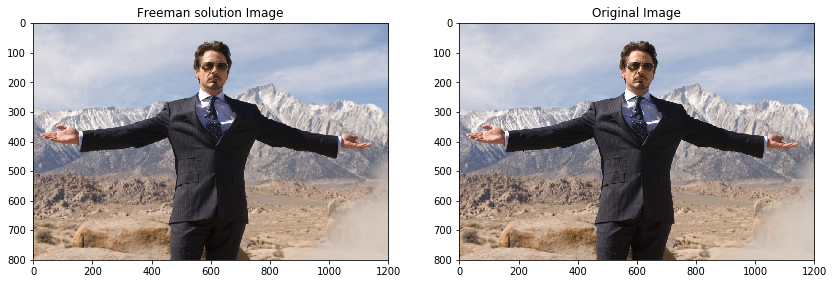

In [336]:
# For sanity check display your solution image here
### YOUR CODE
mosaic_img = read_image(IMG_DIR+'tony.bmp')
soln_image = get_freeman_solution_image(mosaic_img)

'''
plt.figure()
plt.imshow(soln_image)
plt.savefig('tony_freeman.jpg', dpi = 650)
'''
original_image = read_image(IMG_DIR+'tony.jpg')

# For sanity check display your solution image here
plt.figure (figsize = (14, 7))
plt.subplot(1, 2, 1)
plt.imshow(soln_image)
plt.title('Freeman solution Image')

plt.subplot(1, 2, 2)
plt.imshow(original_image)
plt.title('Original Image')
plt.show()

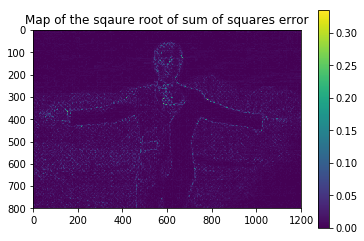

The average per-pixel error for tony is: 0.00018119562988594135
The maximum per-pixel error for tony is: 0.11183391003460211


In [337]:
pp_err, max_err = compute_errors(soln_image, original_image)
print("The average per-pixel error for tony is: "+str(pp_err))
print("The maximum per-pixel error for tony is: "+str(max_err))

### Zoom to see the artifacts

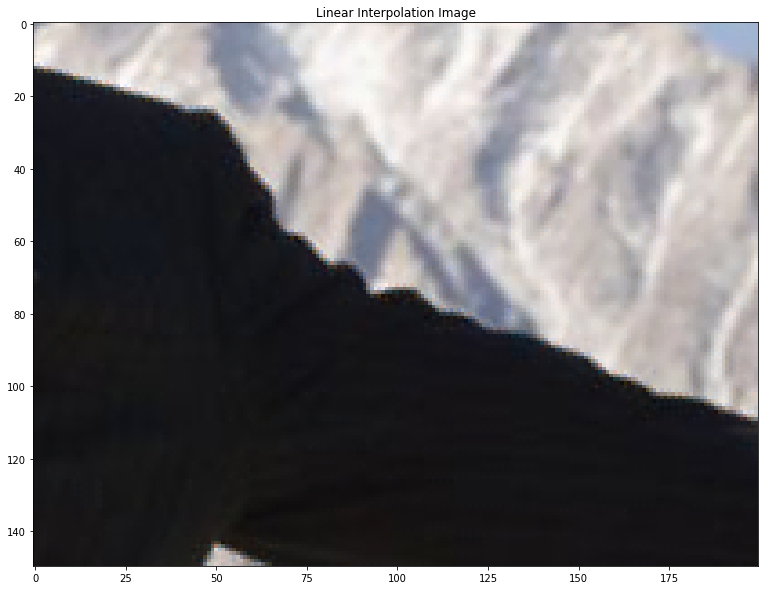

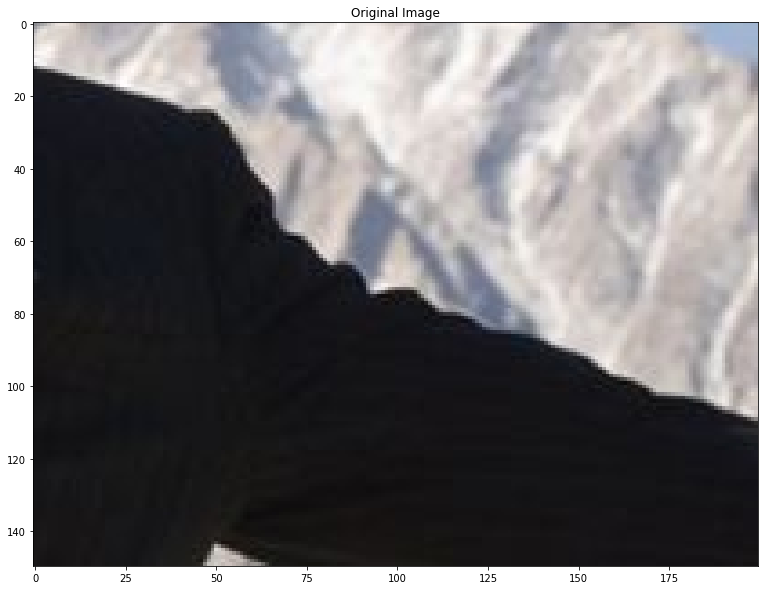

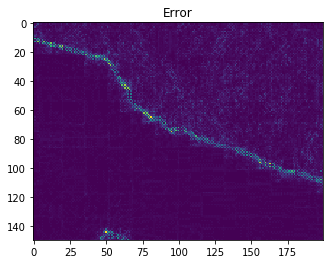

In [338]:
#Zoomin in to see where the artifacts occur
plt.figure(figsize = (24, 10))
#plt.subplot(1, 3, 1)
plt.imshow (soln_image[250:400, 700:900]) #[250:400, 700:900]
plt.title('Linear Interpolation Image')
plt.show()

plt.figure(figsize = (24, 10))
#plt.subplot(1, 3, 2)
plt.imshow (original_image[250:400, 700:900])
plt.title('Original Image')
plt.show()

#Calculating the sum of squared differences 
squrared_diff = ((np.float32(soln_image)-np.float32(original_image))**2) #Squared differences 
squrared_diff_sum = squrared_diff[:, :, 0] + squrared_diff[:, :, 1] + squrared_diff[:, :, 2] 

#plt.subplot(1, 3, 3)
plt.imshow(np.sqrt(squrared_diff_sum[250:400, 700:900]))
plt.title('Error')
plt.savefig('zoomin_tony_freeman.jpg')
plt.show()

### Training Image 2

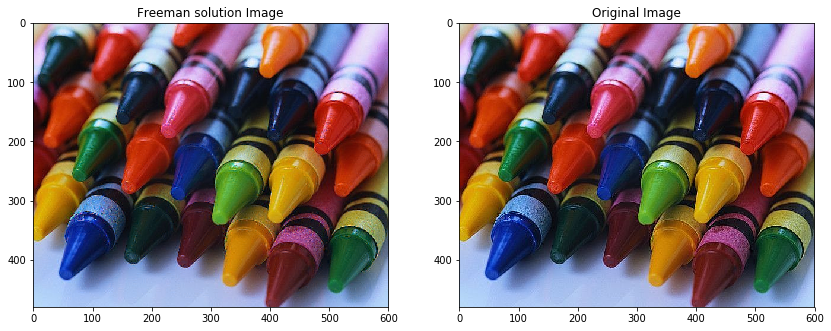

In [331]:
### Feel free to play around with other images for Freeman's method above ###
# For sanity check display your solution image here
### YOUR CODE
mosaic_img = read_image(IMG_DIR+'crayons.bmp')
soln_image = get_freeman_solution_image(mosaic_img)
original_image = read_image(IMG_DIR+'crayons.jpg')

# For sanity check display your solution image here
plt.figure (figsize = (14, 7))
plt.subplot(1, 2, 1)
plt.imshow(soln_image)
plt.title('Freeman solution Image')

plt.subplot(1, 2, 2)
plt.imshow(original_image)
plt.title('Original Image')
plt.show()

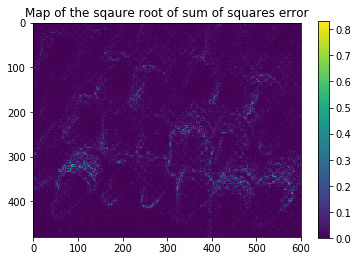

The average per-pixel error for tony is: 0.0013052813554615746
The maximum per-pixel error for tony is: 0.6911956939638599


In [332]:
pp_err, max_err = compute_errors(soln_image, original_image)
print("The average per-pixel error for tony is: "+str(pp_err))
print("The maximum per-pixel error for tony is: "+str(max_err))

### Zoom to see the artifacts

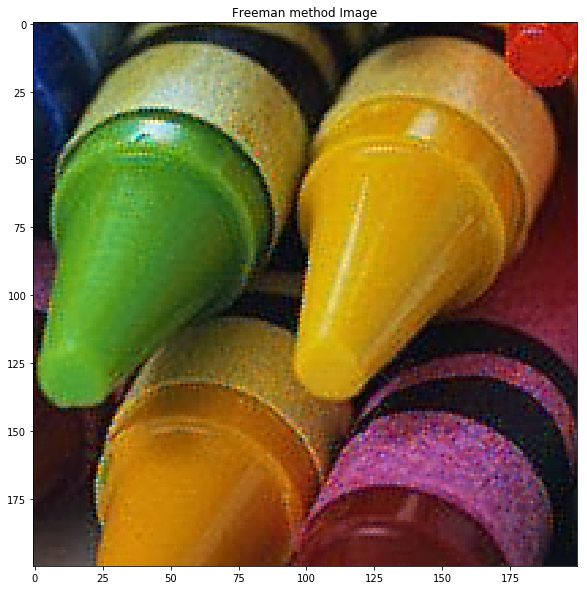

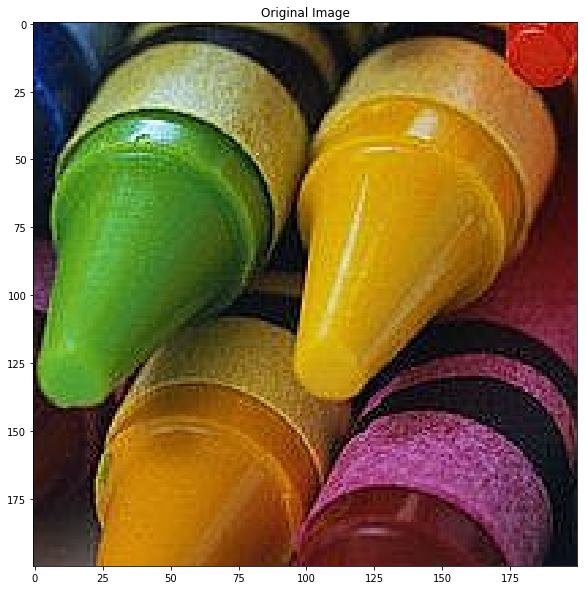

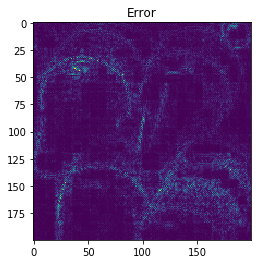

In [334]:
#Zoomin in to see where the artifacts occur
plt.figure(figsize = (15, 10))
#plt.subplot(1, 3, 1)
plt.imshow (soln_image[200:400, 300:500])
plt.title('Freeman method Image')
plt.show()

plt.figure(figsize = (15, 10))
#plt.subplot(1, 3, 2)
plt.imshow (original_image[200:400, 300:500])
plt.title('Original Image')
plt.show()

#Calculating the sum of squared differences 
squrared_diff = ((np.float32(soln_image)-np.float32(original_image))**2) #Squared differences 
squrared_diff_sum = squrared_diff[:, :, 0] + squrared_diff[:, :, 1] + squrared_diff[:, :, 2] 

#plt.subplot(1, 3, 3)
plt.imshow(np.sqrt(squrared_diff_sum[200:400, 300:500]))
plt.title('Error')
plt.savefig('zoomin_crayons_freeman.jpg')
plt.show()

### Training Image 3

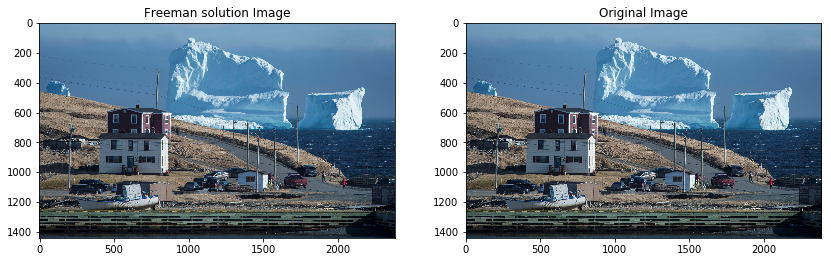

In [328]:
### Feel free to play around with other images for Freeman's method above ###
# For sanity check display your solution image here
### YOUR CODE
mosaic_img = read_image(IMG_DIR+'iceberg.bmp')
soln_image = get_freeman_solution_image(mosaic_img)

'''
plt.figure()
plt.imshow(soln_image)
plt.savefig('iceberg_freeman.jpg', dpi = 650)
'''
original_image = read_image(IMG_DIR+'iceberg.jpg')

# For sanity check display your solution image here
plt.figure (figsize = (14, 7))
plt.subplot(1, 2, 1)
plt.imshow(soln_image)
plt.title('Freeman solution Image')

plt.subplot(1, 2, 2)
plt.imshow(original_image)
plt.title('Original Image')
plt.show()

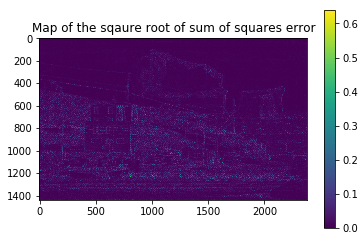

The average per-pixel error for tony is: 0.0008123581583349763
The maximum per-pixel error for tony is: 0.40762783544790465


In [329]:
pp_err, max_err = compute_errors(soln_image, original_image)
print("The average per-pixel error for tony is: "+str(pp_err))
print("The maximum per-pixel error for tony is: "+str(max_err))

### Zoom to see the artifacts

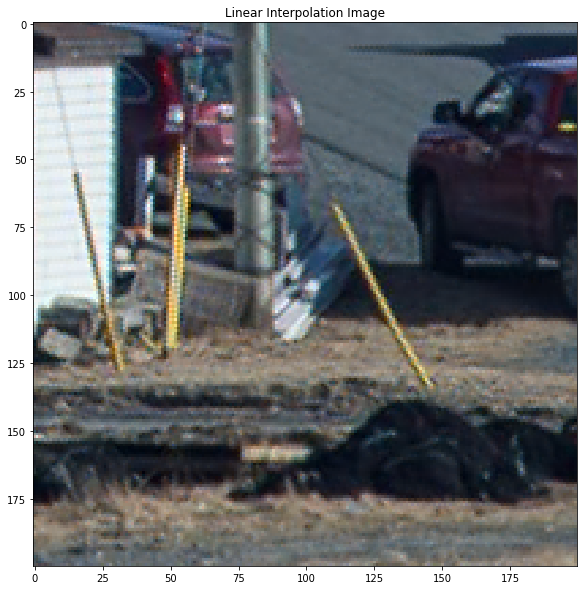

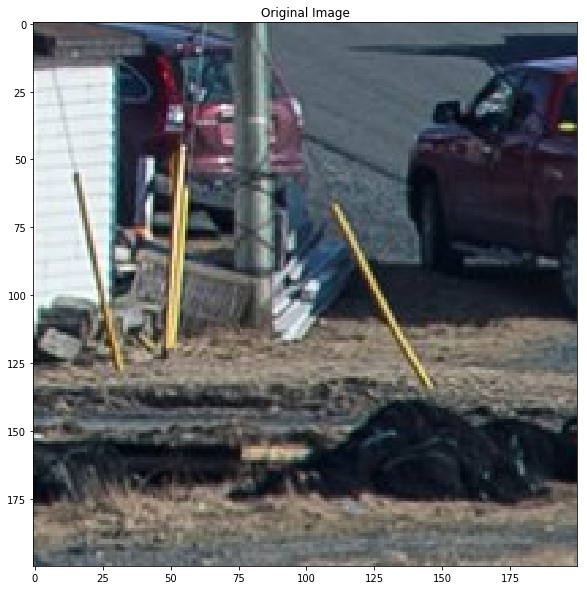

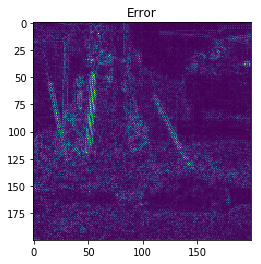

In [273]:
#Zoomin in to see where the artifacts occur
plt.figure(figsize = (24, 10))
#plt.subplot(1, 3, 1)
plt.imshow (soln_image[1000:1200, 1500:1700])
plt.title('Linear Interpolation Image')
plt.show()

plt.figure(figsize = (24, 10))
#plt.subplot(1, 3, 2)
plt.imshow (original_image[1000:1200, 1500:1700])
plt.title('Original Image')
plt.show()

#Calculating the sum of squared differences 
squrared_diff = ((np.float32(soln_image)-np.float32(original_image))**2) #Squared differences 
squrared_diff_sum = squrared_diff[:, :, 0] + squrared_diff[:, :, 1] + squrared_diff[:, :, 2] 

#plt.subplot(1, 3, 3)
plt.imshow(np.sqrt(squrared_diff_sum[1000:1200, 1500:1700]))
plt.title('Error')
plt.savefig('zoomin_iceberg_freeman.jpg')
plt.show()

### Testing Image

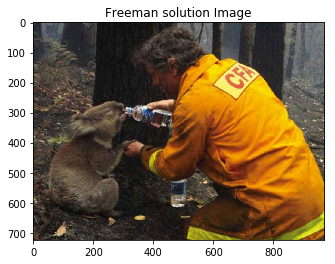

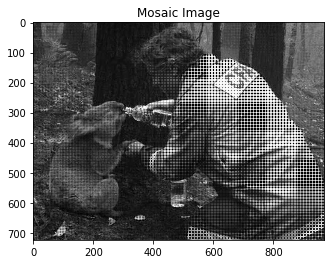

In [76]:
mosaic_img = read_image(IMG_DIR+'hope.bmp')
soln_image = get_freeman_solution_image(mosaic_img)

# Generate your solution image here and show it
plt.figure ()
plt.imshow(soln_image)
plt.title('Freeman solution Image')
plt.show()

plt.figure ()
plt.imshow(mosaic_img)
plt.title('Mosaic Image')
plt.show()

### Mosaicing an Image

Now lets take a step backwards and mosaic an image.

In [67]:
def get_mosaic_image(original_image):
    '''
    Generate the mosaic image using the Bayer Pattern.
    '''
    red, green, blue, = create_mask(original_image) #Creating the mask and extracting individual Bayer components 
    
    mosaic = red + green+ blue
    
    #Merging the three components of an mosaic image 
    new_img = cv2.merge((mosaic, mosaic, mosaic))
    
    #Converting the data type back to uint8
    mosaic_img = new_img.astype(np.uint8)
    
    return mosaic_img

### Checking get_mosaic_image() with given images

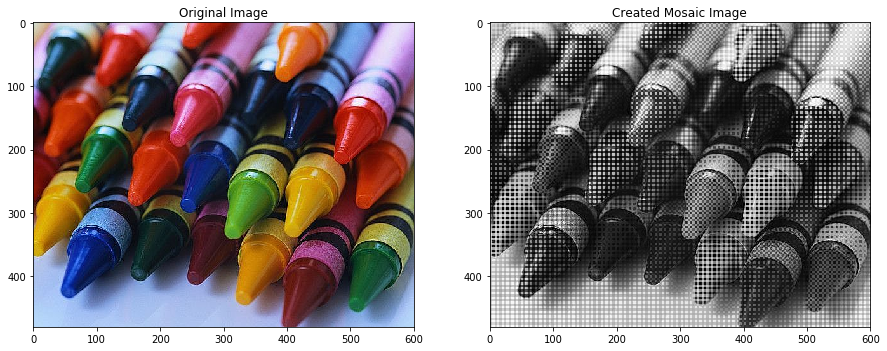

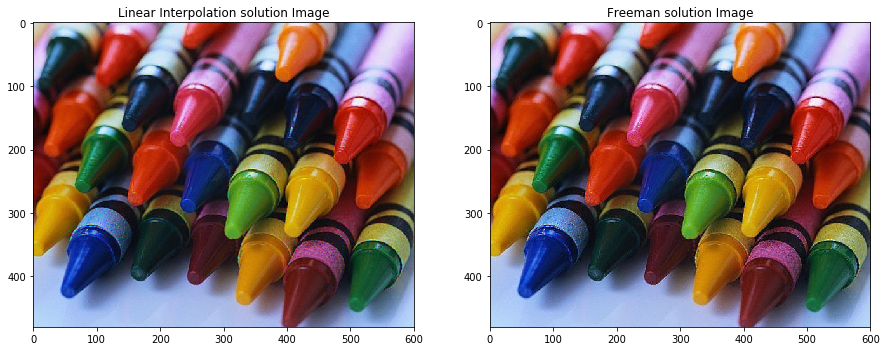

In [68]:
image1 = read_image(IMG_DIR+'crayons.jpg')
mosaic_image1 = get_mosaic_image(image1) #Creating the mosaic image 
linear_interp_image1 = get_solution_image(mosaic_image1) #Using linear interpolation to demosaic 
freeman_image1 = get_freeman_solution_image(mosaic_image1) #Using Freeman method to demosaic 

# Generate your solution image here and show it
plt.figure(figsize = (15, 7))
plt.subplot(1,2,1)
plt.imshow(image1)
plt.title('Original Image')
plt.subplot(1,2,2)
plt.imshow(mosaic_image1)
plt.title('Created Mosaic Image')
plt.show()

plt.figure(figsize = (15, 7))
plt.subplot(1,2,1)
plt.imshow(linear_interp_image1)
plt.title('Linear Interpolation solution Image')
plt.subplot(1,2,2)
plt.imshow(freeman_image1)
plt.title('Freeman solution Image')

plt.show()

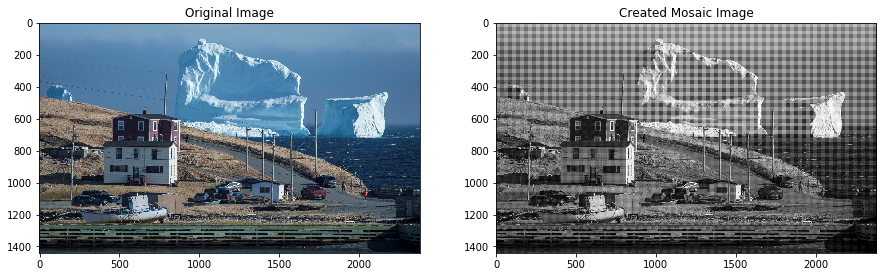

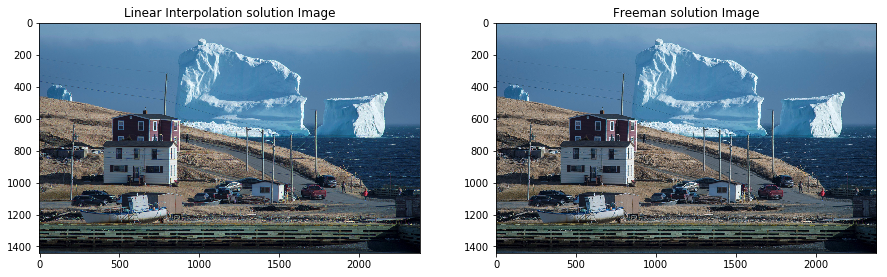

In [69]:
image1 = read_image(IMG_DIR+'iceberg.jpg')
mosaic_image1 = get_mosaic_image(image1) #Creating the mosaic image 
linear_interp_image1 = get_solution_image(mosaic_image1) #Using linear interpolation to demosaic 
freeman_image1 = get_freeman_solution_image(mosaic_image1) #Using Freeman method to demosaic 

# Generate your solution image here and show it
plt.figure(figsize = (15, 7))
plt.subplot(1,2,1)
plt.imshow(image1)
plt.title('Original Image')
plt.subplot(1,2,2)
plt.imshow(mosaic_image1)
plt.title('Created Mosaic Image')
plt.show()

plt.figure(figsize = (15, 7))
plt.subplot(1,2,1)
plt.imshow(linear_interp_image1)
plt.title('Linear Interpolation solution Image')
plt.subplot(1,2,2)
plt.imshow(freeman_image1)
plt.title('Freeman solution Image')

plt.show()

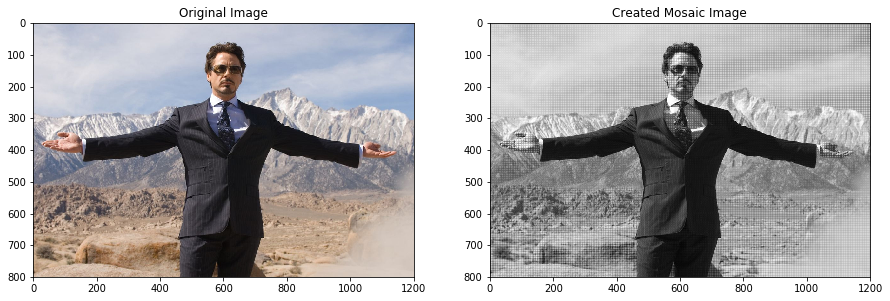

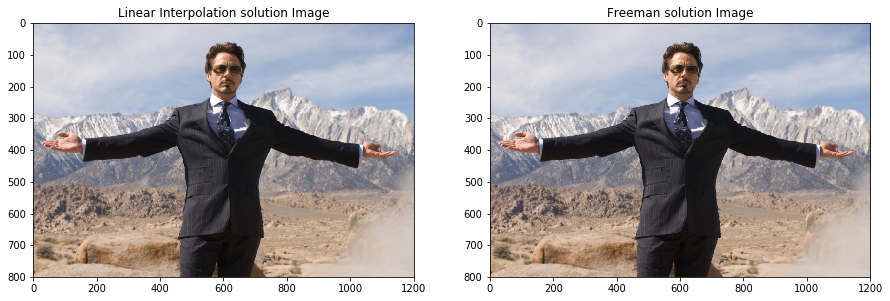

In [70]:
image1 = read_image(IMG_DIR+'tony.jpg')
mosaic_image1 = get_mosaic_image(image1) #Creating the mosaic image 
linear_interp_image1 = get_solution_image(mosaic_image1) #Using linear interpolation to demosaic 
freeman_image1 = get_freeman_solution_image(mosaic_image1) #Using Freeman method to demosaic 

# Generate your solution image here and show it
plt.figure(figsize = (15, 7))
plt.subplot(1,2,1)
plt.imshow(image1)
plt.title('Original Image')
plt.subplot(1,2,2)
plt.imshow(mosaic_image1)
plt.title('Created Mosaic Image')
plt.show()

plt.figure(figsize = (15, 7))
plt.subplot(1,2,1)
plt.imshow(linear_interp_image1)
plt.title('Linear Interpolation solution Image')
plt.subplot(1,2,2)
plt.imshow(freeman_image1)
plt.title('Freeman solution Image')

plt.show()

Use any 3 images you find interesting and generate their mosaics as well as their demosaics. Try to find images that break your demosaicing function.

### Image 1 of choice

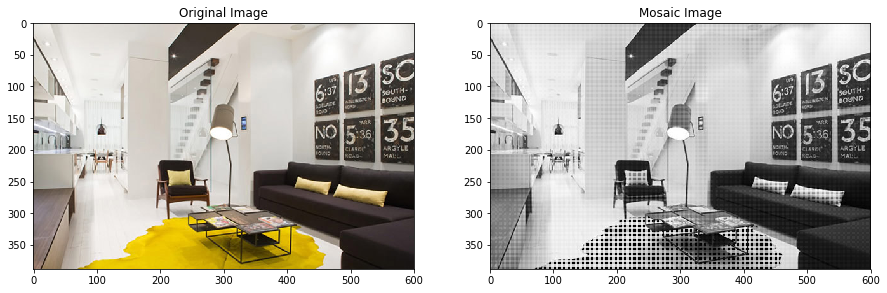

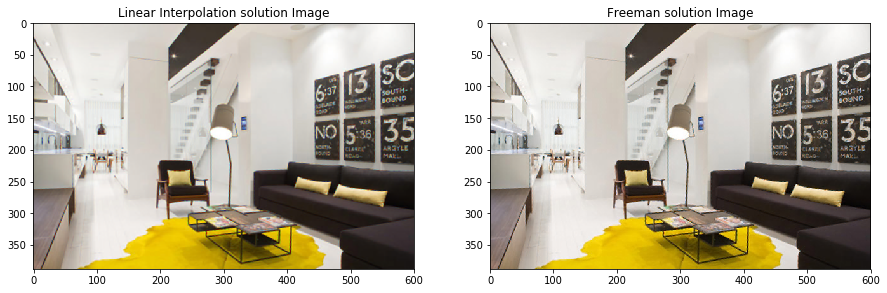

In [339]:
image1 = read_image('try45.jpg')
mosaic_image1 = get_mosaic_image(image1) #Creating the mosaic image 
linear_interp_image1 = get_solution_image(mosaic_image1) #Using linear interpolation to demosaic 
freeman_image1 = get_freeman_solution_image(mosaic_image1) #Using Freeman method to demosaic 

# Generate your solution image here and show it
plt.figure(figsize = (15, 7))
plt.subplot(1,2,1)
plt.imshow(image1)
plt.title('Original Image')
plt.subplot(1,2,2)
plt.imshow(mosaic_image1)
plt.title('Mosaic Image')
plt.show()

plt.figure(figsize = (15, 7))
plt.subplot(1,2,1)
plt.imshow(linear_interp_image1)
plt.title('Linear Interpolation solution Image')
plt.subplot(1,2,2)
plt.imshow(freeman_image1)
plt.title('Freeman solution Image')

plt.show()

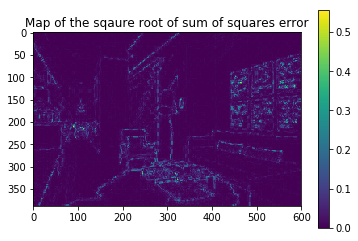

The average per-pixel error for tony is: 0.0013168317498820832
The maximum per-pixel error for tony is: 0.30837370242214535


In [340]:
#Error maps with output of Freeman solution 
pp_err1, max_err1 = compute_errors(freeman_image1, image1) #False Colour Artifact
print("The average per-pixel error for tony is: "+str(pp_err1))
print("The maximum per-pixel error for tony is: "+str(max_err1))

### Zoom in to show the artifact in above image

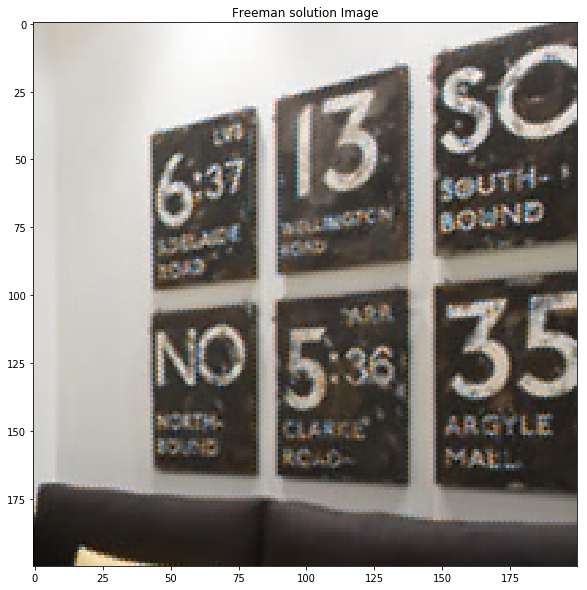

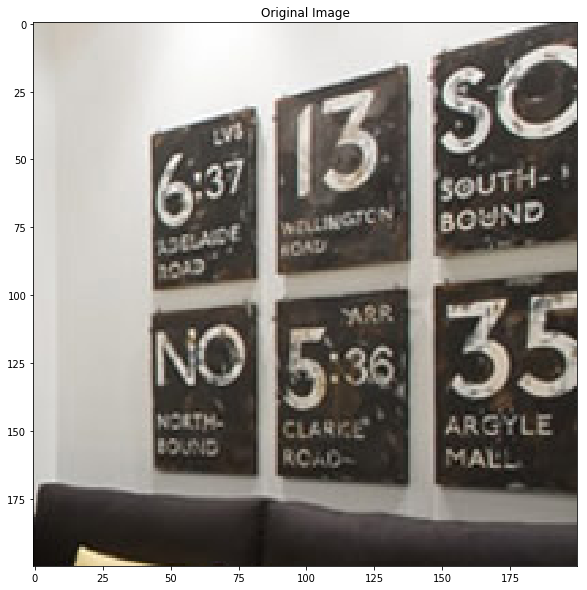

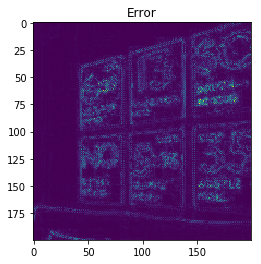

In [348]:
#Zoomin in to see where the artifacts occur
plt.figure(figsize = (24, 10))
#plt.subplot(1, 3, 1)
plt.imshow (freeman_image1[50:250, 400:600])
plt.title('Freeman solution Image')
plt.show()

plt.figure(figsize = (24, 10))
#plt.subplot(1, 3, 2)
plt.imshow (image1[50:250, 400:600])
plt.title('Original Image')
plt.show()

#Calculating the sum of squared differences 
squrared_diff = ((np.float32(freeman_image1)-np.float32(image1))**2) #Squared differences 
squrared_diff_sum = squrared_diff[:, :, 0] + squrared_diff[:, :, 1] + squrared_diff[:, :, 2] 

#plt.subplot(1, 3, 3)
plt.imshow(np.sqrt(squrared_diff_sum[50:250, 400:600]))
plt.title('Error')
plt.show()

### Image 2

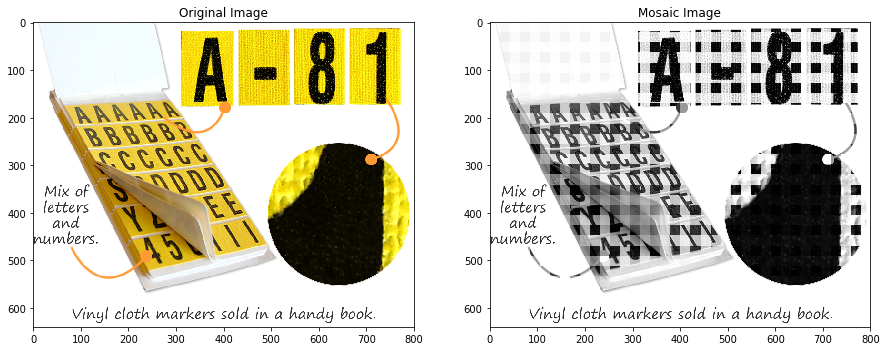

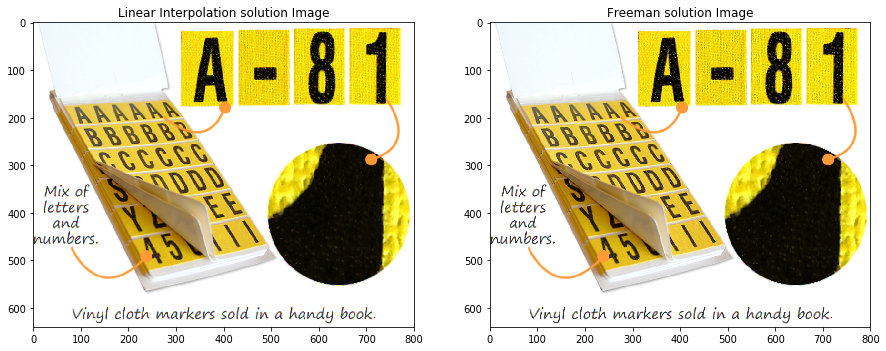

In [292]:
image1 = read_image('try41.png')
mosaic_image1 = get_mosaic_image(image1) #Creating the mosaic image 
linear_interp_image1 = get_solution_image(mosaic_image1) #Using linear interpolation to demosaic 
freeman_image1 = get_freeman_solution_image(mosaic_image1) #Using Freeman method to demosaic 

# Generate your solution image here and show it
plt.figure(figsize = (15, 7))
plt.subplot(1,2,1)
plt.imshow(image1)
plt.title('Original Image')
plt.subplot(1,2,2)
plt.imshow(mosaic_image1)
plt.title('Mosaic Image')
plt.show()

plt.figure(figsize = (15, 7))
plt.subplot(1,2,1)
plt.imshow(linear_interp_image1)
plt.title('Linear Interpolation solution Image')
plt.subplot(1,2,2)
plt.imshow(freeman_image1)
plt.title('Freeman solution Image')

plt.show()

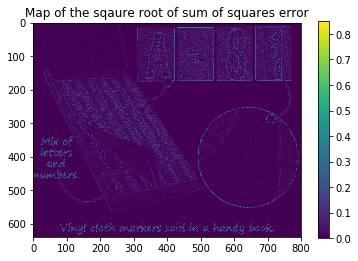

The average per-pixel error for tony is: 0.002631826250720877
The maximum per-pixel error for tony is: 0.7236755094194542


In [293]:
#Error maps with output of Freeman solution 
pp_err1, max_err1 = compute_errors(freeman_image1, image1) #False colour artifact
print("The average per-pixel error for tony is: "+str(pp_err1))
print("The maximum per-pixel error for tony is: "+str(max_err1))

### Zoom in to show the artifact in above image

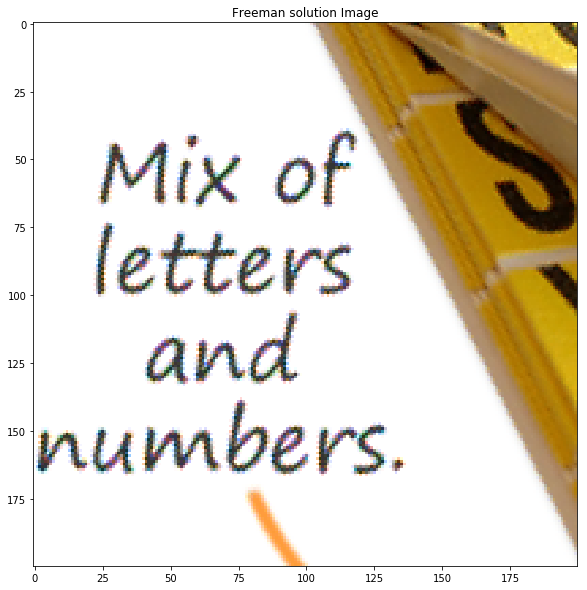

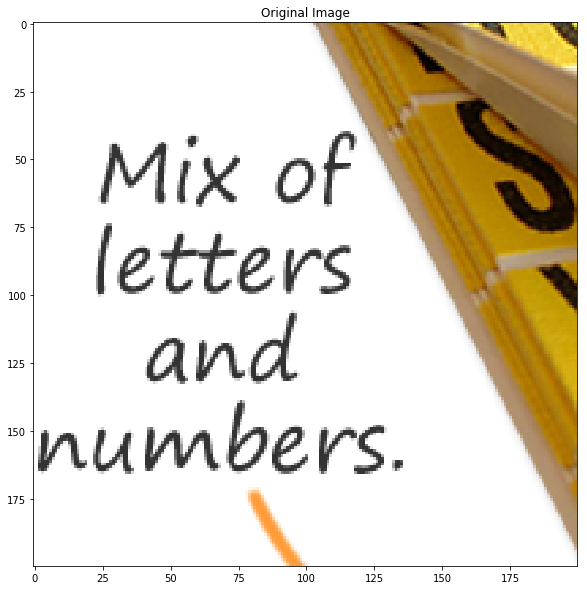

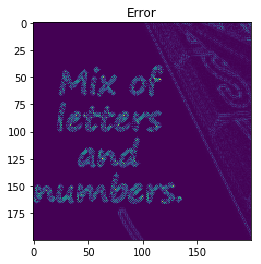

In [307]:
#Zoomin in to see where the artifacts occur
plt.figure(figsize = (24, 10))
#plt.subplot(1, 3, 1)
plt.imshow (freeman_image1[300:500,:200])
plt.title('Freeman solution Image')
plt.show()

plt.figure(figsize = (24, 10))
#plt.subplot(1, 3, 2)
plt.imshow (image1[300:500,:200])
plt.title('Original Image')
plt.show()

#Calculating the sum of squared differences 
squrared_diff = ((np.float32(freeman_image1)-np.float32(image1))**2) #Squared differences 
squrared_diff_sum = squrared_diff[:, :, 0] + squrared_diff[:, :, 1] + squrared_diff[:, :, 2] 

#plt.subplot(1, 3, 3)
plt.imshow(np.sqrt(squrared_diff_sum[300:500,:200]))
plt.title('Error')
plt.show()

### Bonus Points

In [ ]:
### YOUR CODE HERE ###
### YOU ARE ON YOUR OWN :) ####

In [ ]:
def get_modified_freeman_solution_image(mosaic_img):
    '''
    This is a modified version of freeman method where the original 
    R and B channels are restored as given in the Bayer's pattern after median filtering is done 
    since median filetering changes the original R and B channel values given in Bayer's pattern.
    '''
    #Getting the linear interpolation solution image 
    linear_interp_image = get_solution_image(mosaic_img) 

    #Converting the type of image to float for computing averages correctly
    float_linear_interp_img = np.float32(linear_interp_image)

    #Splitting the channels in the linearly interpolated image 
    red_interpolated, green_interpolated,  blue_interpolated = cv2.split(float_linear_interp_img) 

    #Difference between the R-G and B-G channels
    red_diff = red_interpolated - green_interpolated
    blue_diff = blue_interpolated - green_interpolated

    #Median filtering
    red_filtered = scipy.signal.medfilt2d(red_diff)
    blue_filtered = scipy.signal.medfilt2d(blue_diff)

    #Adding green channel to the differences to get new values for blue and red channels 
    red_freeman = red_filtered + green_interpolated
    blue_freeman = blue_filtered + green_interpolated

    #Extracting the masks from the Bayer's pattern for the three channels 
    red_image, green_image, blue_image = create_mask(mosaic_img)
    
    #Replacing the original pixels for red and blue channels 
    red_freeman[red_image!=0]= red_image[red_image!=0]
    blue_freeman[blue_image!=0]= blue_image[blue_image!=0]

    #Clipping the red and blue pixel values out of (0, 255) range back to the range 
    red_freeman = np.clip(red_freeman, 0., 255.)
    blue_freeman = np.clip(blue_freeman, 0., 255.)
    
    #Merging the three components of an image 
    new_img = cv2.merge((red_freeman,green_interpolated,blue_freeman))

    #Converting the data type back to uint8
    freeman_soln_image = new_img.astype(np.uint8)  
    return freeman_soln_image